In [1]:
from sqlalchemy import create_engine, text
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
from sklearn.metrics.pairwise import haversine_distances
from math import radians, sin, cos, sqrt, atan2
from geopy.distance import geodesic
import fiona
from shapely.geometry import Point
from geopy.geocoders import Nominatim

all_uni_locations Sourced: https://hifld-geoplatform.opendata.arcgis.com/datasets/geoplatform::colleges-and-universities/about

In [2]:
all_uni_locations= pd.read_csv('../data/Colleges_and_Universities.csv')
all_uni_locations

,X,Y,OBJECTID,IPEDSID,NAME,ADDRESS,CITY,STATE,ZIP,ZIP4,...,ALIAS,SIZE_SET,INST_SIZE,PT_ENROLL,FT_ENROLL,TOT_ENROLL,HOUSING,DORM_CAP,TOT_EMP,SHELTER_ID
0,-8.209134e+06,4.953591e+06,1,190752,YESHIVA OF FAR ROCKAWAY DERECH AYSON RABBINICA...,802 HICKSVILLE RD,FAR ROCKAWAY,NY,11691,5219,...,NOT AVAILABLE,24,1,-999,43,43,1,35,15,NOT AVAILABLE
1,-8.267688e+06,4.940383e+06,2,481429,UNIVERSAL TRAINING INSTITUTE,174 JEFFERSON STREET,PERTH AMBOY,NJ,8861,4106,...,NOT AVAILABLE,-2,1,-999,176,176,2,-999,15,NOT AVAILABLE
2,-7.353945e+06,2.082890e+06,3,241739,UNIVERSIDAD ANA G. MENDEZ-CUPEY CAMPUS,1399 AVE. ANA G. MENDEZ,SAN JUAN,PR,926,2602,...,UAGM CUPEY,18,3,2780,6113,8893,2,-999,1020,NOT AVAILABLE
3,-1.006191e+07,4.664997e+06,4,455071,HEALING ARTS CENTER,"10073 MANCHESTER ROAD, SUITE 100",ST. LOUIS,MO,63122,NOT AVAILABLE,...,NOT AVAILABLE,-2,1,131,-999,131,2,-999,15,NOT AVAILABLE
4,-8.797220e+06,4.290711e+06,5,455141,AVEDA INSTITUTE-CHAPEL HILL,"201 S. ESTES DRIVE, SPACE 200 B",CHAPEL HILL,NC,27514,7001,...,NOT AVAILABLE,-2,1,-999,216,216,2,-999,25,NOT AVAILABLE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6554,-9.317151e+06,5.308190e+06,6555,494889,BAKER COLLEGE - FLINT,1050 WEST BRISTOL ROAD,FLINT,MI,48507,5508,...,NOT AVAILABLE,-2,-2,-999,-999,-999,-1,-999,-999,NOT AVAILABLE
6555,-1.082780e+07,4.536689e+06,6556,494898,WELLSPRING SCHOOL OF ALLIED HEALTH-WICHITA,"650 N CARRIAGE PARKWAY, STE 55",WICHITA,KS,67208,4501,...,NOT AVAILABLE,-2,1,-999,38,38,2,-999,14,NOT AVAILABLE
6556,-8.145887e+06,4.983035e+06,6557,494904,ACCESS CAREERS-ISLANDIA,"1930 VETERANS HIGHWAY, SUITE 10",ISLANDIA,NY,11749,1599,...,NOT AVAILABLE,-2,1,43,20,63,2,-999,18,NOT AVAILABLE
6557,-1.304572e+07,3.865065e+06,6558,494913,FRANCISCAN SCHOOL OF THEOLOGY - SAN DIEGO,5998 ALCALA PARK,SAN DIEGO,CA,92110,2492,...,NOT AVAILABLE,-2,-2,-999,-999,-999,-1,-999,-999,NOT AVAILABLE


hbcus Sourced: https://nces.ed.gov/ipeds/datacenter/InstitutionByName.aspx?goToReportId=1&sid=1214ca4d-d341-4739-af2b-bb571778daae&rtid=1

In [3]:
hbcus= pd.read_csv('../data/hbcu_list.csv')
hbcus

,unitid,institution name,year,HD2022.Historically Black College or University
0,100654,Alabama A & M University,2022,Yes
1,100724,Alabama State University,2022,Yes
2,101240,Gadsden State Community College,2022,Yes
3,101462,J. F. Drake State Community and Technical College,2022,Yes
4,101569,Lawson State Community College,2022,Yes
...,...,...,...,...
96,237215,Bluefield State University,2022,Yes
97,237899,West Virginia State University,2022,Yes
98,243665,University of the Virgin Islands,2022,Yes
99,440916,Southern University Law Center,2022,Yes


In [4]:
hbcu_merged=all_uni_locations.merge(hbcus, left_on='IPEDSID', right_on='unitid')
hbcu_merged

,X,Y,OBJECTID,IPEDSID,NAME,ADDRESS,CITY,STATE,ZIP,ZIP4,...,FT_ENROLL,TOT_ENROLL,HOUSING,DORM_CAP,TOT_EMP,SHELTER_ID,unitid,institution name,year,HD2022.Historically Black College or University
0,-8.425464e+06,4.609303e+06,22,163338,UNIVERSITY OF MARYLAND EASTERN SHORE,J.T. WILLIAMS HALL,PRINCESS ANNE,MD,21853,1299,...,2209,2646,1,1798,765,NOT AVAILABLE,163338,University of Maryland Eastern Shore,2022,Yes
1,-9.802458e+06,3.593069e+06,27,102030,BISHOP STATE COMMUNITY COLLEGE,351 NORTH BROAD STREET,MOBILE,AL,36603,5898,...,755,2176,2,-999,290,NOT AVAILABLE,102030,Bishop State Community College,2022,Yes
2,-9.382946e+06,3.558622e+06,146,133650,FLORIDA AGRICULTURAL AND MECHANICAL UNIVERSITY,1500 S MARTIN LUTHER KING JR BLVD,TALLAHASSEE,FL,32307,NOT AVAILABLE,...,7735,9184,1,2746,1830,NOT AVAILABLE,133650,Florida Agricultural and Mechanical University,2022,Yes
3,-1.095974e+07,3.428517e+06,325,227854,ST PHILIP'S COLLEGE,1801 MARTIN LUTHER KING DR,SAN ANTONIO,TX,78203,2098,...,1570,12696,2,-999,836,NOT AVAILABLE,227854,St Philip's College,2022,Yes
4,-8.407892e+06,4.856108e+06,413,211608,CHEYNEY UNIVERSITY OF PENNSYLVANIA,1837 UNIVERSITY CIRCLE,CHEYNEY,PA,19319,0200,...,559,623,1,560,136,NOT AVAILABLE,211608,Cheyney University of Pennsylvania,2022,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,-8.752139e+06,4.271082e+06,6089,199582,SAINT AUGUSTINE'S UNIVERSITY,1315 OAKWOOD AVENUE,RALEIGH,NC,27610,2298,...,922,1110,1,1026,295,NOT AVAILABLE,199582,Saint Augustine's University,2022,Yes
97,-8.782952e+06,4.297077e+06,6200,199157,NORTH CAROLINA CENTRAL UNIVERSITY,1801 FAYETTEVILLE STREET,DURHAM,NC,27707,NOT AVAILABLE,...,6307,8078,1,3496,1404,NOT AVAILABLE,199157,North Carolina Central University,2022,Yes
98,-1.044562e+07,3.835148e+06,6204,160649,SOUTHERN UNIVERSITY AT SHREVEPORT,3050 MARTIN LUTHER KING DR,SHREVEPORT,LA,71107,NOT AVAILABLE,...,1325,3013,1,240,338,NOT AVAILABLE,160649,Southern University at Shreveport,2022,Yes
99,-8.930586e+06,4.312610e+06,6218,199999,WINSTON-SALEM STATE UNIVERSITY,601 MARTIN LUTHER KING JR DR,WINSTON-SALEM,NC,27110,0001,...,4353,5169,1,2454,951,NOT AVAILABLE,199999,Winston-Salem State University,2022,Yes


In [5]:
hbcu_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101 entries, 0 to 100
Data columns (total 49 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   X                                                101 non-null    float64
 1   Y                                                101 non-null    float64
 2   OBJECTID                                         101 non-null    int64  
 3   IPEDSID                                          101 non-null    int64  
 4   NAME                                             101 non-null    object 
 5   ADDRESS                                          101 non-null    object 
 6   CITY                                             101 non-null    object 
 7   STATE                                            101 non-null    object 
 8   ZIP                                              101 non-null    int64  
 9   ZIP4                            

In [6]:

hbcu_locs=folium.Map(location=[30.4275125,	-84.28844136], zoom_start=5, min_zoom=4, max_zoom=25)
for row_index, row_values in hbcu_merged.iterrows():
    loc = [row_values['LATITUDE'], row_values['LONGITUDE']]
    pop = str(row_values['institution name'])
    icon=folium.Icon(color="black",icon="fa-solid fa-building-columns" , prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop,
        icon = icon) 

    marker.add_to(hbcu_locs)
hbcu_locs.save('../maps/hbcu_locs.html')

hbcu_locs

In [7]:
hbcu_merged.STATE.unique()
#seeing which states/territories are represented in the df

array(['MD', 'AL', 'FL', 'TX', 'PA', 'TN', 'SC', 'AR', 'GA', 'OH', 'DC',
       'VI', 'NC', 'LA', 'MO', 'KY', 'VA', 'WV', 'DE', 'MS', 'OK'],
      dtype=object)

Source: https://www.census.gov/cgi-bin/geo/shapefiles/index.php?year=2020&layergroup=Census+Tracts

In [8]:
al_ct = gpd.read_file('../data/AL census/tl_2020_01_tract.shp')
al_ct

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,01,045,020801,01045020801,208.01,Census Tract 208.01,G5020,S,19261326,0,+31.3971437,-085.6615959,"POLYGON ((-85.70064 31.38509, -85.70043 31.385..."
1,01,017,954200,01017954200,9542,Census Tract 9542,G5020,S,62998696,34641,+32.8341436,-085.2678516,"POLYGON ((-85.31549 32.80580, -85.31354 32.808..."
2,01,017,953800,01017953800,9538,Census Tract 9538,G5020,S,515692207,11516898,+33.0302580,-085.3867880,"POLYGON ((-85.59345 33.00012, -85.59333 33.000..."
3,01,017,954300,01017954300,9543,Census Tract 9543,G5020,S,132642536,178276,+32.7766468,-085.2734917,"POLYGON ((-85.38077 32.78301, -85.37985 32.782..."
4,01,017,954700,01017954700,9547,Census Tract 9547,G5020,S,38036820,264376,+32.7702191,-085.1744682,"POLYGON ((-85.22897 32.74543, -85.22894 32.745..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1432,01,069,040205,01069040205,402.05,Census Tract 402.05,G5020,S,8597200,89063,+31.2310522,-085.4721506,"POLYGON ((-85.50281 31.23736, -85.50261 31.238..."
1433,01,069,040203,01069040203,402.03,Census Tract 402.03,G5020,S,14602534,0,+31.2613323,-085.4742453,"POLYGON ((-85.50379 31.24638, -85.50281 31.247..."
1434,01,069,040801,01069040801,408.01,Census Tract 408.01,G5020,S,20146187,217773,+31.1882942,-085.4430914,"POLYGON ((-85.47512 31.20789, -85.47504 31.208..."
1435,01,069,041901,01069041901,419.01,Census Tract 419.01,G5020,S,37528654,316521,+31.1937795,-085.2970892,"POLYGON ((-85.34396 31.16111, -85.34330 31.162..."


all census tract files Sourced: https://www.census.gov/cgi-bin/geo/shapefiles/index.php?year=2020&layergroup=Census+Tracts

<Axes: >

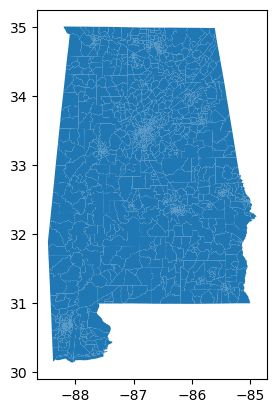

In [9]:
#testing out the files before dowloading all 21
al_ct.plot()

In [10]:
ar_ct = gpd.read_file('../data/AR census/tl_2020_05_tract.shp')
dc_ct = gpd.read_file('../data/DC census/tl_2020_11_tract.shp')
de_ct = gpd.read_file('../data/DE census/tl_2020_10_tract.shp')
fl_ct = gpd.read_file('../data/FL census/tl_2020_12_tract.shp')
ga_ct = gpd.read_file('../data/GA census/tl_2020_13_tract.shp')
ky_ct = gpd.read_file('../data/KY census/tl_2020_21_tract.shp')
la_ct = gpd.read_file('../data/LA census/tl_2020_22_tract.shp')
md_ct = gpd.read_file('../data/MD census/tl_2020_24_tract.shp')
mo_ct = gpd.read_file('../data/MO census/tl_2020_29_tract.shp')
ms_ct = gpd.read_file('../data/MS census/tl_2020_28_tract.shp')
nc_ct = gpd.read_file('../data/NC census/tl_2020_37_tract.shp')
oh_ct = gpd.read_file('../data/OH census/tl_2020_39_tract.shp')
ok_ct = gpd.read_file('../data/OK census/tl_2020_40_tract.shp')
pa_ct = gpd.read_file('../data/PA census/tl_2020_42_tract.shp')
sc_ct = gpd.read_file('../data/SC census/tl_2020_45_tract.shp')
tn_ct = gpd.read_file('../data/TN census/tl_2020_47_tract.shp')
tx_ct = gpd.read_file('../data/TX census/tl_2020_48_tract.shp')
va_ct = gpd.read_file('../data/VA census/tl_2020_51_tract.shp')
vi_ct = gpd.read_file('../data/VI census/tl_2020_78_tract.shp')
wv_ct = gpd.read_file('../data/WV census/tl_2020_54_tract.shp')

al_ct1= al_ct.to_crs('EPSG:4326')
ar_ct1= ar_ct.to_crs('EPSG:4326')
dc_ct1= dc_ct.to_crs('EPSG:4326')
de_ct1= de_ct.to_crs('EPSG:4326')
fl_ct1= fl_ct.to_crs('EPSG:4326')
ga_ct1= ga_ct.to_crs('EPSG:4326')
ky_ct1= ky_ct.to_crs('EPSG:4326')
la_ct1= la_ct.to_crs('EPSG:4326')
md_ct1= md_ct.to_crs('EPSG:4326')
mo_ct1= mo_ct.to_crs('EPSG:4326')
ms_ct1= ms_ct.to_crs('EPSG:4326')
nc_ct1= nc_ct.to_crs('EPSG:4326')
oh_ct1= oh_ct.to_crs('EPSG:4326')
ok_ct1= ok_ct.to_crs('EPSG:4326')
pa_ct1= pa_ct.to_crs('EPSG:4326')
sc_ct1= sc_ct.to_crs('EPSG:4326')
tn_ct1= tn_ct.to_crs('EPSG:4326')
tx_ct1= tx_ct.to_crs('EPSG:4326')
va_ct1= va_ct.to_crs('EPSG:4326')
vi_ct1= vi_ct.to_crs('EPSG:4326')
wv_ct1= wv_ct.to_crs('EPSG:4326') 

merged_ct = gpd.pd.concat([ al_ct, ar_ct, dc_ct, de_ct, fl_ct, ga_ct, ky_ct, la_ct, md_ct, mo_ct, ms_ct, nc_ct, oh_ct, ok_ct, pa_ct, sc_ct, tn_ct, tx_ct, va_ct, vi_ct, wv_ct])
merged_ct.to_file("../data/census_tracts_21_states.shp")

In [11]:
merged_ct=gpd.read_file('../data/census_tracts_21_states.shp')

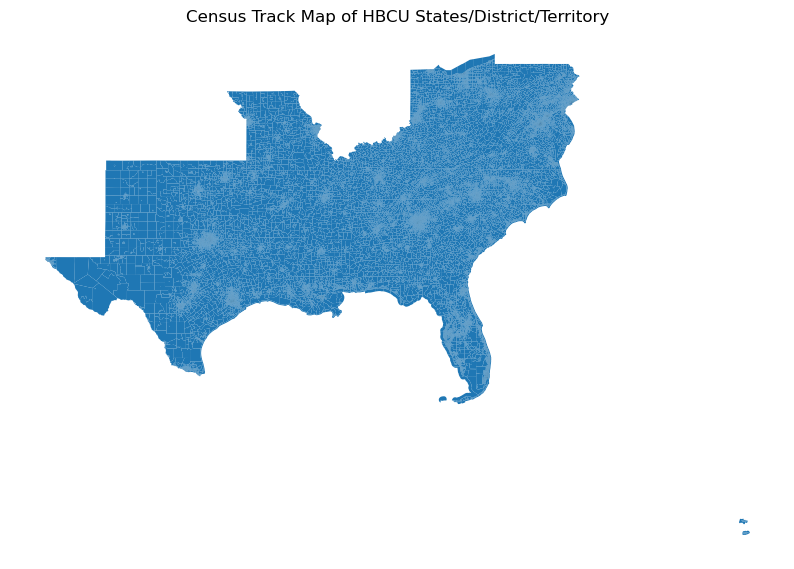

In [12]:
fig, ax = plt.subplots(figsize=(10,10))
merged_ct.plot(ax=ax)
plt.title("Census Track Map of HBCU States/District/Territory")
ax.axis('off');

In [13]:
merged_ct

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,01,045,020801,01045020801,208.01,Census Tract 208.01,G5020,S,19261326,0,+31.3971437,-085.6615959,"POLYGON ((-85.70064 31.38509, -85.70043 31.385..."
1,01,017,954200,01017954200,9542,Census Tract 9542,G5020,S,62998696,34641,+32.8341436,-085.2678516,"POLYGON ((-85.31549 32.80580, -85.31354 32.808..."
2,01,017,953800,01017953800,9538,Census Tract 9538,G5020,S,515692207,11516898,+33.0302580,-085.3867880,"POLYGON ((-85.59345 33.00012, -85.59333 33.000..."
3,01,017,954300,01017954300,9543,Census Tract 9543,G5020,S,132642536,178276,+32.7766468,-085.2734917,"POLYGON ((-85.38077 32.78301, -85.37985 32.782..."
4,01,017,954700,01017954700,9547,Census Tract 9547,G5020,S,38036820,264376,+32.7702191,-085.1744682,"POLYGON ((-85.22897 32.74543, -85.22894 32.745..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
40567,54,059,957100,54059957100,9571,Census Tract 9571,G5020,S,281450737,6061,+37.8766154,-082.3121718,"POLYGON ((-82.42064 37.84763, -82.42059 37.847..."
40568,54,059,957700,54059957700,9577,Census Tract 9577,G5020,S,167185738,1902924,+37.5976514,-081.8838589,"POLYGON ((-81.99204 37.65671, -81.99194 37.657..."
40569,54,059,957600,54059957600,9576,Census Tract 9576,G5020,S,186194814,161067,+37.5995997,-082.0588289,"POLYGON ((-82.16949 37.61333, -82.16943 37.613..."
40570,54,101,970102,54101970102,9701.02,Census Tract 9701.02,G5020,S,420676844,1371888,+38.6168540,-080.3868135,"POLYGON ((-80.54400 38.61600, -80.54389 38.616..."


Source: https://www.census.gov/data/datasets/time-series/demo/labor-force/acs-employ.html

In [14]:
hbcu_merged['geometry'] = [Point(xy) for xy in zip(hbcu_merged['LONGITUDE'], hbcu_merged['LATITUDE'])]
geo_hbcu = gpd.GeoDataFrame(hbcu_merged, geometry='geometry', crs='EPSG:4326')
geo_hbcu['buffer'] = geo_hbcu['geometry'].buffer(25 / 69.0)  
geo_hbcu

C:\Users\joyce\AppData\Local\Temp\ipykernel_19076\417221718.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geo_hbcu['buffer'] = geo_hbcu['geometry'].buffer(25 / 69.0)


,X,Y,OBJECTID,IPEDSID,NAME,ADDRESS,CITY,STATE,ZIP,ZIP4,...,HOUSING,DORM_CAP,TOT_EMP,SHELTER_ID,unitid,institution name,year,HD2022.Historically Black College or University,geometry,buffer
0,-8.425464e+06,4.609303e+06,22,163338,UNIVERSITY OF MARYLAND EASTERN SHORE,J.T. WILLIAMS HALL,PRINCESS ANNE,MD,21853,1299,...,1,1798,765,NOT AVAILABLE,163338,University of Maryland Eastern Shore,2022,Yes,POINT (-75.68723 38.21119),"POLYGON ((-75.32491 38.21119, -75.32665 38.175..."
1,-9.802458e+06,3.593069e+06,27,102030,BISHOP STATE COMMUNITY COLLEGE,351 NORTH BROAD STREET,MOBILE,AL,36603,5898,...,2,-999,290,NOT AVAILABLE,102030,Bishop State Community College,2022,Yes,POINT (-88.05698 30.69397),"POLYGON ((-87.69466 30.69397, -87.69641 30.658..."
2,-9.382946e+06,3.558622e+06,146,133650,FLORIDA AGRICULTURAL AND MECHANICAL UNIVERSITY,1500 S MARTIN LUTHER KING JR BLVD,TALLAHASSEE,FL,32307,NOT AVAILABLE,...,1,2746,1830,NOT AVAILABLE,133650,Florida Agricultural and Mechanical University,2022,Yes,POINT (-84.28844 30.42751),"POLYGON ((-83.92612 30.42751, -83.92787 30.392..."
3,-1.095974e+07,3.428517e+06,325,227854,ST PHILIP'S COLLEGE,1801 MARTIN LUTHER KING DR,SAN ANTONIO,TX,78203,2098,...,2,-999,836,NOT AVAILABLE,227854,St Philip's College,2022,Yes,POINT (-98.45299 29.41456),"POLYGON ((-98.09067 29.41456, -98.09241 29.379..."
4,-8.407892e+06,4.856108e+06,413,211608,CHEYNEY UNIVERSITY OF PENNSYLVANIA,1837 UNIVERSITY CIRCLE,CHEYNEY,PA,19319,0200,...,1,560,136,NOT AVAILABLE,211608,Cheyney University of Pennsylvania,2022,Yes,POINT (-75.52938 39.93229),"POLYGON ((-75.16706 39.93229, -75.16880 39.896..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,-8.752139e+06,4.271082e+06,6089,199582,SAINT AUGUSTINE'S UNIVERSITY,1315 OAKWOOD AVENUE,RALEIGH,NC,27610,2298,...,1,1026,295,NOT AVAILABLE,199582,Saint Augustine's University,2022,Yes,POINT (-78.62181 35.78503),"POLYGON ((-78.25949 35.78503, -78.26123 35.749..."
97,-8.782952e+06,4.297077e+06,6200,199157,NORTH CAROLINA CENTRAL UNIVERSITY,1801 FAYETTEVILLE STREET,DURHAM,NC,27707,NOT AVAILABLE,...,1,3496,1404,NOT AVAILABLE,199157,North Carolina Central University,2022,Yes,POINT (-78.89860 35.97424),"POLYGON ((-78.53628 35.97424, -78.53803 35.938..."
98,-1.044562e+07,3.835148e+06,6204,160649,SOUTHERN UNIVERSITY AT SHREVEPORT,3050 MARTIN LUTHER KING DR,SHREVEPORT,LA,71107,NOT AVAILABLE,...,1,240,338,NOT AVAILABLE,160649,Southern University at Shreveport,2022,Yes,POINT (-93.83456 32.54563),"POLYGON ((-93.47224 32.54563, -93.47398 32.510..."
99,-8.930586e+06,4.312610e+06,6218,199999,WINSTON-SALEM STATE UNIVERSITY,601 MARTIN LUTHER KING JR DR,WINSTON-SALEM,NC,27110,0001,...,1,2454,951,NOT AVAILABLE,199999,Winston-Salem State University,2022,Yes,POINT (-80.22482 36.08708),"POLYGON ((-79.86250 36.08708, -79.86425 36.051..."


In [15]:
buffered_hbcu_locs = folium.Map(location=[30.4275125, -84.28844136], zoom_start=5, min_zoom=4, max_zoom=25)


for row_index, row_values in hbcu_merged.iterrows():
    loc = [row_values['LATITUDE'], row_values['LONGITUDE']]
    pop = str(row_values['institution name'])
    icon = folium.Icon(color="black", icon="fa-solid fa-building-columns", prefix='fa')

    marker = folium.Marker(
        location=loc,
        popup=pop,
        icon=icon
    )

    marker.add_to(buffered_hbcu_locs)

for x, geo_values in geo_hbcu.iterrows():
    buffer_geojson = folium.GeoJson(
        geo_values['buffer'],
        name='buffer',
        style_function=lambda x: {'fillColor': 'red', 'color': 'red'}
    )
    
    buffer_geojson.add_to(buffered_hbcu_locs)
buffered_hbcu_locs


In [16]:
merged_ct = merged_ct.set_geometry('geometry')
geo_hbcu = geo_hbcu.set_geometry('buffer')
tracts_within_buffer =gpd.sjoin(merged_ct, geo_hbcu, how='inner', op='within')
tracts_within_buffer.to_csv('../data/buffer_tracts.csv', index=False)
tracts_within_buffer.info()

C:\Users\joyce\anaconda3\envs\capstone_env\lib\site-packages\IPython\core\interactiveshell.py:3448: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
C:\Users\joyce\AppData\Local\Temp\ipykernel_19076\2710277863.py:3: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4269
Right CRS: EPSG:4326

  tracts_within_buffer =gpd.sjoin(merged_ct, geo_hbcu, how='inner', op='within')


<class 'pandas.core.frame.DataFrame'>
Index: 23905 entries, 5 to 40440
Data columns (total 64 columns):
 #   Column                                           Non-Null Count  Dtype   
---  ------                                           --------------  -----   
 0   STATEFP                                          23905 non-null  object  
 1   COUNTYFP                                         23905 non-null  object  
 2   TRACTCE                                          23905 non-null  object  
 3   GEOID                                            23905 non-null  object  
 4   NAME_left                                        23905 non-null  object  
 5   NAMELSAD                                         23905 non-null  object  
 6   MTFCC                                            23905 non-null  object  
 7   FUNCSTAT                                         23905 non-null  object  
 8   ALAND                                            23905 non-null  int64   
 9   AWATER                

In [17]:
grouped_df =  tracts_within_buffer.groupby('institution name')['TRACTCE'].agg(list).reset_index()
grouped_df.columns = ['institution name', 'TRACTCE_list']
grouped_df.explode('TRACTCE_list')

,institution name,TRACTCE_list
0,Alabama A & M University,010623
0,Alabama A & M University,001301
0,Alabama A & M University,005703
0,Alabama A & M University,005704
0,Alabama A & M University,010705
...,...,...
99,Xavier University of Louisiana,028600
99,Xavier University of Louisiana,030000
99,Xavier University of Louisiana,023004
99,Xavier University of Louisiana,029500


Occupational Employment and Wage Statistics Source:  https://www.bls.gov/oes/tables.htm

In [18]:
pip install openpyxl


Note: you may need to restart the kernel to use updated packages.


In [19]:
conda install -c conda-forge openpyxl

Channels:
 - conda-forge
 - defaults
Platform: win-64
Solving environment: ...working... done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [20]:
occ_wages = pd.read_excel('../data/oesm22st/oesm22st/state_M2022_dl.xlsx',sheet_name='All May 2022 data')
occ_wages.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37569 entries, 0 to 37568
Data columns (total 32 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   AREA          37569 non-null  int64  
 1   AREA_TITLE    37569 non-null  object 
 2   AREA_TYPE     37569 non-null  int64  
 3   PRIM_STATE    37569 non-null  object 
 4   NAICS         37569 non-null  int64  
 5   NAICS_TITLE   37569 non-null  object 
 6   I_GROUP       37569 non-null  object 
 7   OWN_CODE      37569 non-null  int64  
 8   OCC_CODE      37569 non-null  object 
 9   OCC_TITLE     37569 non-null  object 
 10  O_GROUP       37569 non-null  object 
 11  TOT_EMP       37569 non-null  object 
 12  EMP_PRSE      37569 non-null  object 
 13  JOBS_1000     37569 non-null  object 
 14  LOC_QUOTIENT  37569 non-null  object 
 15  PCT_TOTAL     0 non-null      float64
 16  PCT_RPT       0 non-null      float64
 17  H_MEAN        37569 non-null  object 
 18  A_MEAN        37569 non-nu

In [21]:
wages_mean_state_occ_fam= occ_wages[occ_wages['O_GROUP'] == 'major'][['AREA_TITLE', 'OCC_TITLE','A_MEAN']]
wages_mean_state_occ_fam.reset_index(drop=True)

,AREA_TITLE,OCC_TITLE,A_MEAN
0,Alabama,Management Occupations,110500
1,Alabama,Business and Financial Operations Occupations,76490
2,Alabama,Computer and Mathematical Occupations,92440
3,Alabama,Architecture and Engineering Occupations,97910
4,Alabama,"Life, Physical, and Social Science Occupations",69810
...,...,...,...
1183,Virgin Islands,"Farming, Fishing, and Forestry Occupations",38810
1184,Virgin Islands,Construction and Extraction Occupations,49700
1185,Virgin Islands,"Installation, Maintenance, and Repair Occupations",46710
1186,Virgin Islands,Production Occupations,40000


In [22]:
wages_mean_state_occ_fam.A_MEAN=wages_mean_state_occ_fam.A_MEAN.astype(int).fillna(0.00)
wages_mean_state_occ_fam=wages_mean_state_occ_fam.reset_index(drop=True)
wages_mean_state_occ_fam

,AREA_TITLE,OCC_TITLE,A_MEAN
0,Alabama,Management Occupations,110500
1,Alabama,Business and Financial Operations Occupations,76490
2,Alabama,Computer and Mathematical Occupations,92440
3,Alabama,Architecture and Engineering Occupations,97910
4,Alabama,"Life, Physical, and Social Science Occupations",69810
...,...,...,...
1183,Virgin Islands,"Farming, Fishing, and Forestry Occupations",38810
1184,Virgin Islands,Construction and Extraction Occupations,49700
1185,Virgin Islands,"Installation, Maintenance, and Repair Occupations",46710
1186,Virgin Islands,Production Occupations,40000


In [23]:
states= {'Alabama', 'Arkansas', 'District of Columbia', 'Delaware', 'Florida', 'Georgia', 'Kentucky', 'Louisiana', 'Maryland',
        'Missouri', 'Mississippi', 'North Carolina', 'Ohio', 'Oklahoma','Pennsylvania', 'South Carolina', 'Tennessee', 'Texas', 'Virginia', 
        'Virgin Islands', 'West Virginia'}
filtered_wages_occ= wages_mean_state_occ_fam.loc[wages_mean_state_occ_fam['AREA_TITLE'].isin(states)].copy()
filtered_wages_occ

,AREA_TITLE,OCC_TITLE,A_MEAN
0,Alabama,Management Occupations,110500
1,Alabama,Business and Financial Operations Occupations,76490
2,Alabama,Computer and Mathematical Occupations,92440
3,Alabama,Architecture and Engineering Occupations,97910
4,Alabama,"Life, Physical, and Social Science Occupations",69810
...,...,...,...
1183,Virgin Islands,"Farming, Fishing, and Forestry Occupations",38810
1184,Virgin Islands,Construction and Extraction Occupations,49700
1185,Virgin Islands,"Installation, Maintenance, and Repair Occupations",46710
1186,Virgin Islands,Production Occupations,40000


In [24]:
pivot1= filtered_wages_occ.pivot_table(index='AREA_TITLE', columns='OCC_TITLE', values='A_MEAN')
top_wages_by_occ = pivot1.style.apply(lambda series: ['background-color: green' if val in series.nlargest(5).values else '' for val in series], axis=0)
pivot1
top_wages_by_occ

OCC_TITLE,Architecture and Engineering Occupations,"Arts, Design, Entertainment, Sports, and Media Occupations",Building and Grounds Cleaning and Maintenance Occupations,Business and Financial Operations Occupations,Community and Social Service Occupations,Computer and Mathematical Occupations,Construction and Extraction Occupations,Educational Instruction and Library Occupations,"Farming, Fishing, and Forestry Occupations",Food Preparation and Serving Related Occupations,Healthcare Practitioners and Technical Occupations,Healthcare Support Occupations,"Installation, Maintenance, and Repair Occupations",Legal Occupations,"Life, Physical, and Social Science Occupations",Management Occupations,Office and Administrative Support Occupations,Personal Care and Service Occupations,Production Occupations,Protective Service Occupations,Sales and Related Occupations,Transportation and Material Moving Occupations
AREA_TITLE,,,,,,,,,,,,,,,,,,,,,,
Alabama,97910,51980,29510,76490,47000,92440,45410,53940,38340,25500,75180,29720,53460,100320,69810,110500,38680,29900,41530,41120,40240,38160
Arkansas,75730,52680,29790,70190,48540,78540,44270,51260,37280,27870,74720,31270,47810,92180,68000,93480,39140,30530,40290,40670,41090,38890
Delaware,94230,57540,35850,88080,53360,109040,57140,59800,37530,31750,94320,34800,57210,142420,88820,157600,45970,35370,45890,51900,48890,43030
District of Columbia,118540,109130,40330,107730,71530,119610,68740,79490,52380,44850,109450,39850,62470,202480,116960,163960,59030,46690,66460,72430,56250,52140
Florida,85580,62450,32400,78600,50170,94200,48090,55820,32880,31580,89800,35790,49720,104810,69110,121170,42600,33400,41230,51580,47130,42010
Georgia,88640,71660,32340,83030,52760,100750,50200,58300,38810,27960,90100,34260,52680,116520,75530,126390,41880,31500,41250,44050,47500,43410
Kentucky,76040,51370,30850,73700,48230,80470,51310,52890,36210,26840,84140,33930,53720,82220,65240,102050,40680,29520,44280,39920,41610,46330
Louisiana,92880,74480,27800,69620,47230,78720,50350,51980,41880,25340,80170,27490,52070,94530,73870,111070,38720,28430,51900,41810,37860,43250
Maryland,105670,68550,36830,94020,58620,117500,57090,71300,38800,34320,108360,38860,58440,119180,97180,130690,47660,37410,47580,58760,49570,45220


In [25]:
pivot2= filtered_wages_occ.pivot_table(index='AREA_TITLE', columns='OCC_TITLE', values='A_MEAN')
bottom_wages_by_occ = pivot2.style.apply(lambda series: ['background-color: red' if val in series.nsmallest(5).values else '' for val in series], axis=0)
pivot2
bottom_wages_by_occ

OCC_TITLE,Architecture and Engineering Occupations,"Arts, Design, Entertainment, Sports, and Media Occupations",Building and Grounds Cleaning and Maintenance Occupations,Business and Financial Operations Occupations,Community and Social Service Occupations,Computer and Mathematical Occupations,Construction and Extraction Occupations,Educational Instruction and Library Occupations,"Farming, Fishing, and Forestry Occupations",Food Preparation and Serving Related Occupations,Healthcare Practitioners and Technical Occupations,Healthcare Support Occupations,"Installation, Maintenance, and Repair Occupations",Legal Occupations,"Life, Physical, and Social Science Occupations",Management Occupations,Office and Administrative Support Occupations,Personal Care and Service Occupations,Production Occupations,Protective Service Occupations,Sales and Related Occupations,Transportation and Material Moving Occupations
AREA_TITLE,,,,,,,,,,,,,,,,,,,,,,
Alabama,97910,51980,29510,76490,47000,92440,45410,53940,38340,25500,75180,29720,53460,100320,69810,110500,38680,29900,41530,41120,40240,38160
Arkansas,75730,52680,29790,70190,48540,78540,44270,51260,37280,27870,74720,31270,47810,92180,68000,93480,39140,30530,40290,40670,41090,38890
Delaware,94230,57540,35850,88080,53360,109040,57140,59800,37530,31750,94320,34800,57210,142420,88820,157600,45970,35370,45890,51900,48890,43030
District of Columbia,118540,109130,40330,107730,71530,119610,68740,79490,52380,44850,109450,39850,62470,202480,116960,163960,59030,46690,66460,72430,56250,52140
Florida,85580,62450,32400,78600,50170,94200,48090,55820,32880,31580,89800,35790,49720,104810,69110,121170,42600,33400,41230,51580,47130,42010
Georgia,88640,71660,32340,83030,52760,100750,50200,58300,38810,27960,90100,34260,52680,116520,75530,126390,41880,31500,41250,44050,47500,43410
Kentucky,76040,51370,30850,73700,48230,80470,51310,52890,36210,26840,84140,33930,53720,82220,65240,102050,40680,29520,44280,39920,41610,46330
Louisiana,92880,74480,27800,69620,47230,78720,50350,51980,41880,25340,80170,27490,52070,94530,73870,111070,38720,28430,51900,41810,37860,43250
Maryland,105670,68550,36830,94020,58620,117500,57090,71300,38800,34320,108360,38860,58440,119180,97180,130690,47660,37410,47580,58760,49570,45220


In [26]:
merged_ct['COUNTYFP'].unique()
counties={'045', '017', '125', '023', '117', '051', '109', '105', '097',
       '015', '089', '031', '113', '083', '073', '035', '009', '047',
       '101', '133', '059', '019', '121', '071', '049', '103', '123',
       '043', '079', '115', '053', '093', '001', '011', '111', '027',
       '081', '033', '037', '055', '007', '005', '095', '003', '119',
       '077', '131', '029', '025', '069', '087', '127', '107', '067',
       '091', '057', '129', '075', '039', '021', '065', '013', '099',
       '061', '063', '085', '041', '149', '145', '141', '137', '139',
       '143', '135', '147', '086', '247', '215', '153', '179', '195',
       '285', '185', '241', '159', '209', '297', '249', '303', '267',
       '157', '299', '243', '223', '287', '281', '235', '189', '173',
       '193', '237', '255', '155', '177', '321', '275', '221', '295',
       '251', '191', '169', '289', '175', '151', '199', '233', '309',
       '245', '305', '277', '165', '183', '317', '293', '307', '231',
       '311', '283', '227', '161', '211', '279', '253', '171', '213',
       '313', '273', '269', '205', '163', '315', '271', '207', '261',
       '219', '225', '301', '257', '217', '167', '259', '291', '201',
       '181', '263', '319', '229', '197', '265', '187', '239', '203',
       '510', '186', '375', '453', '335', '339', '409', '397', '491',
       '331', '485', '441', '439', '423', '363', '351', '443', '417',
       '377', '451', '455', '403', '407', '337', '477', '481', '493',
       '355', '469', '371', '401', '391', '381', '445', '463', '467',
       '419', '479', '437', '507', '369', '489', '385', '473', '329',
       '499', '483', '361', '327', '503', '349', '459', '505', '427',
       '325', '411', '465', '323', '373', '413', '389', '471', '475',
       '347', '383', '379', '495', '433', '395', '449', '457', '341',
       '387', '399', '393', '367', '365', '425', '497', '357', '431',
       '487', '359', '435', '429', '353', '415', '333', '461', '421',
       '345', '343', '501', '405', '447', '810', '683', '740', '700',
       '710', '670', '550', '640', '760', '650', '600', '770', '775',
       '680', '800', '570', '036', '580', '540', '630', '520', '678',
       '840', '530', '750', '790', '590', '620', '595', '685', '830',
       '660', '820', '690', '720', '610', '730', '735', '030', '010',
       '020'}

Labor force data by county, not seasonally adjusted, October 2022–November 2023 p
county level unemployment data Source: https://www.bls.gov/lau/tables.htm#mcounty

In [27]:
dtype_map = {'LAUS Code': str, 'State_FIPS_Code	': str, 'County_FIPS_Code': str, 'County Name/State Abbreviation': str,
            'Period	': str, 'Force': float, 'Employed':float,'Unemployed':float,'(%)':str}
unem_by_county= pd.read_csv('../data/laucntycur14/unemployment_county.csv', dtype=dtype_map)

unem_by_county.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45083 entries, 0 to 45082
Data columns (total 9 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   LAUS Code                       45081 non-null  object 
 1   State_FIPS_Code                 45080 non-null  float64
 2   County_FIPS_Code                45080 non-null  object 
 3   County Name/State Abbreviation  45080 non-null  object 
 4   Period                          45080 non-null  object 
 5   Force                           45080 non-null  float64
 6   Employed                        45080 non-null  float64
 7   Unemployed                      45080 non-null  float64
 8   (%)                             45082 non-null  object 
dtypes: float64(4), object(5)
memory usage: 3.1+ MB


In [28]:
unem_by_county['State_Abbrev'] = unem_by_county['County Name/State Abbreviation'].apply(lambda x: x[-2:]if pd.notna(x) else '')
unem_by_county

,LAUS Code,State_FIPS_Code,County_FIPS_Code,County Name/State Abbreviation,Period,Force,Employed,Unemployed,(%),State_Abbrev
0,CN0100100000000,1.0,001,"Autauga County, AL",Oct-22,26873.0,26292.0,581.0,2.2,AL
1,CN0100300000000,1.0,003,"Baldwin County, AL",Oct-22,103176.0,100899.0,2277.0,2.2,AL
2,CN0100500000000,1.0,005,"Barbour County, AL",Oct-22,8328.0,7944.0,384.0,4.6,AL
3,CN0100700000000,1.0,007,"Bibb County, AL",Oct-22,8732.0,8520.0,212.0,2.4,AL
4,CN0100900000000,1.0,009,"Blount County, AL",Oct-22,25990.0,25421.0,569.0,2.2,AL
...,...,...,...,...,...,...,...,...,...,...
45078,CN7215100000000,72.0,151,"Yabucoa Municipio, PR",Nov-23 p,9528.0,8790.0,738.0,7.7,PR
45079,CN7215300000000,72.0,153,"Yauco Municipio, PR",Nov-23 p,10843.0,9737.0,1106.0,10.2,PR
45080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,
45081,p = preliminary.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"SOURCE: BLS, LAUS",


In [29]:
unem_by_county['State_Abbrev'].unique()

array(['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'ia', 'FL', 'GA',
       'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA',
       'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY',
       'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
       'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY', 'PR', ''], dtype=object)

In [30]:
states_abbrev={'AL',  'AR', 'DE', 'DC', 'FL', 'GA',
       'KY', 'LA', 'MD', 'MS', 'MO',
       'NC', 'OH', 'OK', 'PA', 'SC',  'TN', 'TX',
        'VA', 'WV', 'VI'}
filtered_unemp= unem_by_county.loc[unem_by_county['State_Abbrev'].isin(states_abbrev)].copy()
filtered_unemp.reset_index(drop=True)

,LAUS Code,State_FIPS_Code,County_FIPS_Code,County Name/State Abbreviation,Period,Force,Employed,Unemployed,(%),State_Abbrev
0,CN0100100000000,1.0,001,"Autauga County, AL",Oct-22,26873.0,26292.0,581.0,2.2,AL
1,CN0100300000000,1.0,003,"Baldwin County, AL",Oct-22,103176.0,100899.0,2277.0,2.2,AL
2,CN0100500000000,1.0,005,"Barbour County, AL",Oct-22,8328.0,7944.0,384.0,4.6,AL
3,CN0100700000000,1.0,007,"Bibb County, AL",Oct-22,8732.0,8520.0,212.0,2.4,AL
4,CN0100900000000,1.0,009,"Blount County, AL",Oct-22,25990.0,25421.0,569.0,2.2,AL
...,...,...,...,...,...,...,...,...,...,...
23669,CN5410100000000,54.0,101,"Webster County, WV",Nov-23 p,3112.0,2966.0,146.0,4.7,WV
23670,CN5410300000000,54.0,103,"Wetzel County, WV",Nov-23 p,6303.0,5990.0,313.0,5,WV
23671,CN5410500000000,54.0,105,"Wirt County, WV",Nov-23 p,2246.0,2133.0,113.0,5,WV
23672,CN5410700000000,54.0,107,"Wood County, WV",Nov-23 p,36201.0,34851.0,1350.0,3.7,WV


In [31]:
filtered_unemp_2022=filtered_unemp.loc[filtered_unemp['Period']=='Oct-22'].copy().reset_index(drop=True)
filtered_unemp_2022

,LAUS Code,State_FIPS_Code,County_FIPS_Code,County Name/State Abbreviation,Period,Force,Employed,Unemployed,(%),State_Abbrev
0,CN0100100000000,1.0,001,"Autauga County, AL",Oct-22,26873.0,26292.0,581.0,2.2,AL
1,CN0100300000000,1.0,003,"Baldwin County, AL",Oct-22,103176.0,100899.0,2277.0,2.2,AL
2,CN0100500000000,1.0,005,"Barbour County, AL",Oct-22,8328.0,7944.0,384.0,4.6,AL
3,CN0100700000000,1.0,007,"Bibb County, AL",Oct-22,8732.0,8520.0,212.0,2.4,AL
4,CN0100900000000,1.0,009,"Blount County, AL",Oct-22,25990.0,25421.0,569.0,2.2,AL
...,...,...,...,...,...,...,...,...,...,...
1686,CN5410100000000,54.0,101,"Webster County, WV",Oct-22,3118.0,2998.0,120.0,3.8,WV
1687,CN5410300000000,54.0,103,"Wetzel County, WV",Oct-22,6416.0,6135.0,281.0,4.4,WV
1688,CN5410500000000,54.0,105,"Wirt County, WV",Oct-22,2266.0,2159.0,107.0,4.7,WV
1689,CN5410700000000,54.0,107,"Wood County, WV",Oct-22,36622.0,35346.0,1276.0,3.5,WV


In [32]:
pd.set_option('display.max_rows', None)
hbcu_merged.COUNTY

0                  SOMERSET
1                    MOBILE
2                      LEON
3                     BEXAR
4                  DELAWARE
5                    SHELBY
6                   BAMBERG
7                TUSCALOOSA
8                 JEFFERSON
9                MONTGOMERY
10                 RICHLAND
11                  PULASKI
12                   FULTON
13                 RICHMOND
14                   GREENE
15     DISTRICT OF COLUMBIA
16               ST. THOMAS
17           BALTIMORE CITY
18                 HARRISON
19                  VOLUSIA
20                     WAKE
21                    ROWAN
22                  ORLEANS
23                  ORLEANS
24                  MADISON
25                   DALLAS
26               MIAMI-DADE
27           ST. LOUIS CITY
28                JEFFERSON
29                   GREENE
30                 RICHLAND
31             HAMPTON CITY
32                JEFFERSON
33                  CHATHAM
34                  LINCOLN
35                JE

In [33]:
filtered_unemp_2022['County_Name'] = filtered_unemp_2022['County Name/State Abbreviation'].str.split(',').str[0]
filtered_unemp_2022

,LAUS Code,State_FIPS_Code,County_FIPS_Code,County Name/State Abbreviation,Period,Force,Employed,Unemployed,(%),State_Abbrev,County_Name
0,CN0100100000000,1.0,001,"Autauga County, AL",Oct-22,26873.0,26292.0,581.0,2.2,AL,Autauga County
1,CN0100300000000,1.0,003,"Baldwin County, AL",Oct-22,103176.0,100899.0,2277.0,2.2,AL,Baldwin County
2,CN0100500000000,1.0,005,"Barbour County, AL",Oct-22,8328.0,7944.0,384.0,4.6,AL,Barbour County
3,CN0100700000000,1.0,007,"Bibb County, AL",Oct-22,8732.0,8520.0,212.0,2.4,AL,Bibb County
4,CN0100900000000,1.0,009,"Blount County, AL",Oct-22,25990.0,25421.0,569.0,2.2,AL,Blount County
5,CN0101100000000,1.0,011,"Bullock County, AL",Oct-22,4783.0,4655.0,128.0,2.7,AL,Bullock County
6,CN0101300000000,1.0,013,"Butler County, AL",Oct-22,8850.0,8560.0,290.0,3.3,AL,Butler County
7,CN0101500000000,1.0,015,"Calhoun County, AL",Oct-22,45985.0,44668.0,1317.0,2.9,AL,Calhoun County
8,CN0101700000000,1.0,017,"Chambers County, AL",Oct-22,15939.0,15545.0,394.0,2.5,AL,Chambers County
9,CN0101900000000,1.0,019,"Cherokee County, AL",Oct-22,11706.0,11431.0,275.0,2.3,AL,Cherokee County


In [34]:
pd.set_option('display.max_rows', None)
filtered_unemp_2022['County_Name']=filtered_unemp_2022['County_Name'].str.replace('County','')
filtered_unemp_2022['County_Name']=filtered_unemp_2022['County_Name'].str.upper()
filtered_unemp_2022['County_Name']

0                          AUTAUGA 
1                          BALDWIN 
2                          BARBOUR 
3                             BIBB 
4                           BLOUNT 
5                          BULLOCK 
6                           BUTLER 
7                          CALHOUN 
8                         CHAMBERS 
9                         CHEROKEE 
10                         CHILTON 
11                         CHOCTAW 
12                          CLARKE 
13                            CLAY 
14                        CLEBURNE 
15                          COFFEE 
16                         COLBERT 
17                         CONECUH 
18                           COOSA 
19                       COVINGTON 
20                        CRENSHAW 
21                         CULLMAN 
22                            DALE 
23                          DALLAS 
24                          DEKALB 
25                          ELMORE 
26                        ESCAMBIA 
27                          

In [35]:
slice=['NAME','CITY','STATE', 'COUNTY', 'COUNTYFIPS', 'IPEDSID','ZIP']
new1=hbcu_merged[slice]

In [36]:
new1

,NAME,CITY,STATE,COUNTY,COUNTYFIPS,IPEDSID,ZIP
0,UNIVERSITY OF MARYLAND EASTERN SHORE,PRINCESS ANNE,MD,SOMERSET,24039,163338,21853
1,BISHOP STATE COMMUNITY COLLEGE,MOBILE,AL,MOBILE,01097,102030,36603
2,FLORIDA AGRICULTURAL AND MECHANICAL UNIVERSITY,TALLAHASSEE,FL,LEON,12073,133650,32307
3,ST PHILIP'S COLLEGE,SAN ANTONIO,TX,BEXAR,48029,227854,78203
4,CHEYNEY UNIVERSITY OF PENNSYLVANIA,CHEYNEY,PA,DELAWARE,42045,211608,19319
5,LE MOYNE-OWEN COLLEGE,MEMPHIS,TN,SHELBY,47157,220604,38126
6,VOORHEES COLLEGE,DENMARK,SC,BAMBERG,45009,218919,29042
7,SHELTON STATE COMMUNITY COLLEGE,TUSCALOOSA,AL,TUSCALOOSA,01125,102067,35405
8,LAWSON STATE COMMUNITY COLLEGE,BIRMINGHAM,AL,JEFFERSON,01073,101569,35221
9,H COUNCILL TRENHOLM STATE COMMUNITY COLLEGE,MONTGOMERY,AL,MONTGOMERY,01101,102313,36108


In [37]:
filtered_unemp_2022['State_FIPS_Code']=filtered_unemp_2022['State_FIPS_Code'].astype(str)
filtered_unemp_2022['State_FIPS_Code']=filtered_unemp_2022['State_FIPS_Code'].astype(str).apply(lambda x: x.split('.')[0].zfill(2))

In [38]:
filtered_unemp_2022

,LAUS Code,State_FIPS_Code,County_FIPS_Code,County Name/State Abbreviation,Period,Force,Employed,Unemployed,(%),State_Abbrev,County_Name
0,CN0100100000000,01,001,"Autauga County, AL",Oct-22,26873.0,26292.0,581.0,2.2,AL,AUTAUGA
1,CN0100300000000,01,003,"Baldwin County, AL",Oct-22,103176.0,100899.0,2277.0,2.2,AL,BALDWIN
2,CN0100500000000,01,005,"Barbour County, AL",Oct-22,8328.0,7944.0,384.0,4.6,AL,BARBOUR
3,CN0100700000000,01,007,"Bibb County, AL",Oct-22,8732.0,8520.0,212.0,2.4,AL,BIBB
4,CN0100900000000,01,009,"Blount County, AL",Oct-22,25990.0,25421.0,569.0,2.2,AL,BLOUNT
5,CN0101100000000,01,011,"Bullock County, AL",Oct-22,4783.0,4655.0,128.0,2.7,AL,BULLOCK
6,CN0101300000000,01,013,"Butler County, AL",Oct-22,8850.0,8560.0,290.0,3.3,AL,BUTLER
7,CN0101500000000,01,015,"Calhoun County, AL",Oct-22,45985.0,44668.0,1317.0,2.9,AL,CALHOUN
8,CN0101700000000,01,017,"Chambers County, AL",Oct-22,15939.0,15545.0,394.0,2.5,AL,CHAMBERS
9,CN0101900000000,01,019,"Cherokee County, AL",Oct-22,11706.0,11431.0,275.0,2.3,AL,CHEROKEE


In [39]:
filtered_unemp_2022['COUNTYFIPS']=filtered_unemp_2022['State_FIPS_Code']+filtered_unemp_2022['County_FIPS_Code']
filtered_unemp_2022

,LAUS Code,State_FIPS_Code,County_FIPS_Code,County Name/State Abbreviation,Period,Force,Employed,Unemployed,(%),State_Abbrev,County_Name,COUNTYFIPS
0,CN0100100000000,01,001,"Autauga County, AL",Oct-22,26873.0,26292.0,581.0,2.2,AL,AUTAUGA,01001
1,CN0100300000000,01,003,"Baldwin County, AL",Oct-22,103176.0,100899.0,2277.0,2.2,AL,BALDWIN,01003
2,CN0100500000000,01,005,"Barbour County, AL",Oct-22,8328.0,7944.0,384.0,4.6,AL,BARBOUR,01005
3,CN0100700000000,01,007,"Bibb County, AL",Oct-22,8732.0,8520.0,212.0,2.4,AL,BIBB,01007
4,CN0100900000000,01,009,"Blount County, AL",Oct-22,25990.0,25421.0,569.0,2.2,AL,BLOUNT,01009
5,CN0101100000000,01,011,"Bullock County, AL",Oct-22,4783.0,4655.0,128.0,2.7,AL,BULLOCK,01011
6,CN0101300000000,01,013,"Butler County, AL",Oct-22,8850.0,8560.0,290.0,3.3,AL,BUTLER,01013
7,CN0101500000000,01,015,"Calhoun County, AL",Oct-22,45985.0,44668.0,1317.0,2.9,AL,CALHOUN,01015
8,CN0101700000000,01,017,"Chambers County, AL",Oct-22,15939.0,15545.0,394.0,2.5,AL,CHAMBERS,01017
9,CN0101900000000,01,019,"Cherokee County, AL",Oct-22,11706.0,11431.0,275.0,2.3,AL,CHEROKEE,01019


In [40]:
unemp_school = pd.merge(new1, filtered_unemp_2022,  on='COUNTYFIPS', how='left')
unemp_school

,NAME,CITY,STATE,COUNTY,COUNTYFIPS,IPEDSID,ZIP,LAUS Code,State_FIPS_Code,County_FIPS_Code,County Name/State Abbreviation,Period,Force,Employed,Unemployed,(%),State_Abbrev,County_Name
0,UNIVERSITY OF MARYLAND EASTERN SHORE,PRINCESS ANNE,MD,SOMERSET,24039,163338,21853,CN2403900000000,24,039,"Somerset County, MD",Oct-22,9174.0,8756.0,418.0,4.6,MD,SOMERSET
1,BISHOP STATE COMMUNITY COLLEGE,MOBILE,AL,MOBILE,01097,102030,36603,CN0109700000000,01,097,"Mobile County, AL",Oct-22,192644.0,186679.0,5965.0,3.1,AL,MOBILE
2,FLORIDA AGRICULTURAL AND MECHANICAL UNIVERSITY,TALLAHASSEE,FL,LEON,12073,133650,32307,CN1207300000000,12,073,"Leon County, FL",Oct-22,163588.0,159046.0,4542.0,2.8,FL,LEON
3,ST PHILIP'S COLLEGE,SAN ANTONIO,TX,BEXAR,48029,227854,78203,CN4802900000000,48,029,"Bexar County, TX",Oct-22,982605.0,947438.0,35167.0,3.6,TX,BEXAR
4,CHEYNEY UNIVERSITY OF PENNSYLVANIA,CHEYNEY,PA,DELAWARE,42045,211608,19319,CN4204500000000,42,045,"Delaware County, PA",Oct-22,304175.0,292475.0,11700.0,3.8,PA,DELAWARE
5,LE MOYNE-OWEN COLLEGE,MEMPHIS,TN,SHELBY,47157,220604,38126,CN4715700000000,47,157,"Shelby County, TN",Oct-22,431123.0,411548.0,19575.0,4.5,TN,SHELBY
6,VOORHEES COLLEGE,DENMARK,SC,BAMBERG,45009,218919,29042,CN4500900000000,45,009,"Bamberg County, SC",Oct-22,4535.0,4281.0,254.0,5.6,SC,BAMBERG
7,SHELTON STATE COMMUNITY COLLEGE,TUSCALOOSA,AL,TUSCALOOSA,01125,102067,35405,CN0112500000000,01,125,"Tuscaloosa County, AL",Oct-22,104255.0,101826.0,2429.0,2.3,AL,TUSCALOOSA
8,LAWSON STATE COMMUNITY COLLEGE,BIRMINGHAM,AL,JEFFERSON,01073,101569,35221,CN0107300000000,01,073,"Jefferson County, AL",Oct-22,321754.0,313714.0,8040.0,2.5,AL,JEFFERSON
9,H COUNCILL TRENHOLM STATE COMMUNITY COLLEGE,MONTGOMERY,AL,MONTGOMERY,01101,102313,36108,CN0110100000000,01,101,"Montgomery County, AL",Oct-22,107198.0,103892.0,3306.0,3.1,AL,MONTGOMERY


In [41]:
drops = ['LAUS Code', 'State_FIPS_Code', 'County_FIPS_Code','(%)',]
unemp_school.drop(columns=drops, axis=1, inplace=True)

In [42]:
unemp_school

,NAME,CITY,STATE,COUNTY,COUNTYFIPS,IPEDSID,ZIP,County Name/State Abbreviation,Period,Force,Employed,Unemployed,State_Abbrev,County_Name
0,UNIVERSITY OF MARYLAND EASTERN SHORE,PRINCESS ANNE,MD,SOMERSET,24039,163338,21853,"Somerset County, MD",Oct-22,9174.0,8756.0,418.0,MD,SOMERSET
1,BISHOP STATE COMMUNITY COLLEGE,MOBILE,AL,MOBILE,01097,102030,36603,"Mobile County, AL",Oct-22,192644.0,186679.0,5965.0,AL,MOBILE
2,FLORIDA AGRICULTURAL AND MECHANICAL UNIVERSITY,TALLAHASSEE,FL,LEON,12073,133650,32307,"Leon County, FL",Oct-22,163588.0,159046.0,4542.0,FL,LEON
3,ST PHILIP'S COLLEGE,SAN ANTONIO,TX,BEXAR,48029,227854,78203,"Bexar County, TX",Oct-22,982605.0,947438.0,35167.0,TX,BEXAR
4,CHEYNEY UNIVERSITY OF PENNSYLVANIA,CHEYNEY,PA,DELAWARE,42045,211608,19319,"Delaware County, PA",Oct-22,304175.0,292475.0,11700.0,PA,DELAWARE
5,LE MOYNE-OWEN COLLEGE,MEMPHIS,TN,SHELBY,47157,220604,38126,"Shelby County, TN",Oct-22,431123.0,411548.0,19575.0,TN,SHELBY
6,VOORHEES COLLEGE,DENMARK,SC,BAMBERG,45009,218919,29042,"Bamberg County, SC",Oct-22,4535.0,4281.0,254.0,SC,BAMBERG
7,SHELTON STATE COMMUNITY COLLEGE,TUSCALOOSA,AL,TUSCALOOSA,01125,102067,35405,"Tuscaloosa County, AL",Oct-22,104255.0,101826.0,2429.0,AL,TUSCALOOSA
8,LAWSON STATE COMMUNITY COLLEGE,BIRMINGHAM,AL,JEFFERSON,01073,101569,35221,"Jefferson County, AL",Oct-22,321754.0,313714.0,8040.0,AL,JEFFERSON
9,H COUNCILL TRENHOLM STATE COMMUNITY COLLEGE,MONTGOMERY,AL,MONTGOMERY,01101,102313,36108,"Montgomery County, AL",Oct-22,107198.0,103892.0,3306.0,AL,MONTGOMERY


In [43]:
unemp_school['Unemployment_Rate']=unemp_school['Unemployed']/unemp_school['Force']
unemp_school['Unemployment_Rate']=unemp_school['Unemployment_Rate'].round(4)*100
unemp_school

,NAME,CITY,STATE,COUNTY,COUNTYFIPS,IPEDSID,ZIP,County Name/State Abbreviation,Period,Force,Employed,Unemployed,State_Abbrev,County_Name,Unemployment_Rate
0,UNIVERSITY OF MARYLAND EASTERN SHORE,PRINCESS ANNE,MD,SOMERSET,24039,163338,21853,"Somerset County, MD",Oct-22,9174.0,8756.0,418.0,MD,SOMERSET,4.56
1,BISHOP STATE COMMUNITY COLLEGE,MOBILE,AL,MOBILE,01097,102030,36603,"Mobile County, AL",Oct-22,192644.0,186679.0,5965.0,AL,MOBILE,3.10
2,FLORIDA AGRICULTURAL AND MECHANICAL UNIVERSITY,TALLAHASSEE,FL,LEON,12073,133650,32307,"Leon County, FL",Oct-22,163588.0,159046.0,4542.0,FL,LEON,2.78
3,ST PHILIP'S COLLEGE,SAN ANTONIO,TX,BEXAR,48029,227854,78203,"Bexar County, TX",Oct-22,982605.0,947438.0,35167.0,TX,BEXAR,3.58
4,CHEYNEY UNIVERSITY OF PENNSYLVANIA,CHEYNEY,PA,DELAWARE,42045,211608,19319,"Delaware County, PA",Oct-22,304175.0,292475.0,11700.0,PA,DELAWARE,3.85
5,LE MOYNE-OWEN COLLEGE,MEMPHIS,TN,SHELBY,47157,220604,38126,"Shelby County, TN",Oct-22,431123.0,411548.0,19575.0,TN,SHELBY,4.54
6,VOORHEES COLLEGE,DENMARK,SC,BAMBERG,45009,218919,29042,"Bamberg County, SC",Oct-22,4535.0,4281.0,254.0,SC,BAMBERG,5.60
7,SHELTON STATE COMMUNITY COLLEGE,TUSCALOOSA,AL,TUSCALOOSA,01125,102067,35405,"Tuscaloosa County, AL",Oct-22,104255.0,101826.0,2429.0,AL,TUSCALOOSA,2.33
8,LAWSON STATE COMMUNITY COLLEGE,BIRMINGHAM,AL,JEFFERSON,01073,101569,35221,"Jefferson County, AL",Oct-22,321754.0,313714.0,8040.0,AL,JEFFERSON,2.50
9,H COUNCILL TRENHOLM STATE COMMUNITY COLLEGE,MONTGOMERY,AL,MONTGOMERY,01101,102313,36108,"Montgomery County, AL",Oct-22,107198.0,103892.0,3306.0,AL,MONTGOMERY,3.08


In [44]:
unemp_school['Unemp_%_Rank']=unemp_school['Unemployment_Rate'].rank()
unemp_school=unemp_school.sort_values(by='Unemp_%_Rank')
unemp_school

,NAME,CITY,STATE,COUNTY,COUNTYFIPS,IPEDSID,ZIP,County Name/State Abbreviation,Period,Force,Employed,Unemployed,State_Abbrev,County_Name,Unemployment_Rate,Unemp_%_Rank
92,LINCOLN UNIVERSITY,JEFFERSON CITY,MO,COLE,29051,177940,65101,"Cole County, MO",Oct-22,39400.0,38677.0,723.0,MO,COLE,1.84,1.0
78,J. F. DRAKE STATE COMMUNITY AND TECHNICAL COLLEGE,HUNTSVILLE,AL,MADISON,01089,101462,35811,"Madison County, AL",Oct-22,199390.0,195328.0,4062.0,AL,MADISON,2.04,3.0
76,ALABAMA A & M UNIVERSITY,NORMAL,AL,MADISON,01089,100654,35762,"Madison County, AL",Oct-22,199390.0,195328.0,4062.0,AL,MADISON,2.04,3.0
24,OAKWOOD UNIVERSITY,HUNTSVILLE,AL,MADISON,01089,101912,35896,"Madison County, AL",Oct-22,199390.0,195328.0,4062.0,AL,MADISON,2.04,3.0
7,SHELTON STATE COMMUNITY COLLEGE,TUSCALOOSA,AL,TUSCALOOSA,01125,102067,35405,"Tuscaloosa County, AL",Oct-22,104255.0,101826.0,2429.0,AL,TUSCALOOSA,2.33,5.5
66,STILLMAN COLLEGE,TUSCALOOSA,AL,TUSCALOOSA,01125,102270,35401,"Tuscaloosa County, AL",Oct-22,104255.0,101826.0,2429.0,AL,TUSCALOOSA,2.33,5.5
26,FLORIDA MEMORIAL UNIVERSITY,MIAMI GARDENS,FL,MIAMI-DADE,12086,133979,33054,"Miami-Dade County, FL",Oct-22,1386267.0,1353554.0,32713.0,FL,MIAMI-DADE,2.36,7.0
8,LAWSON STATE COMMUNITY COLLEGE,BIRMINGHAM,AL,JEFFERSON,01073,101569,35221,"Jefferson County, AL",Oct-22,321754.0,313714.0,8040.0,AL,JEFFERSON,2.50,8.5
35,MILES COLLEGE,FAIRFIELD,AL,JEFFERSON,01073,101675,35064,"Jefferson County, AL",Oct-22,321754.0,313714.0,8040.0,AL,JEFFERSON,2.50,8.5
27,HARRIS-STOWE STATE UNIVERSITY,SAINT LOUIS,MO,ST. LOUIS CITY,29510,177551,63103,"St. Louis city, MO",Oct-22,149956.0,145943.0,4013.0,MO,ST. LOUIS CITY,2.68,10.0


rental data Sourced: https://www.zillow.com/research/data/

In [45]:
rental_df=pd.read_csv('../data/Zip_zori_uc_sfrcondomfr_sm_month.csv')
rental_df

,RegionID,SizeRank,RegionName,RegionType,StateName,State,City,Metro,CountyName,2015-01-31,...,2023-03-31,2023-04-30,2023-05-31,2023-06-30,2023-07-31,2023-08-31,2023-09-30,2023-10-31,2023-11-30,2023-12-31
0,91982,1,77494,zip,TX,TX,Katy,"Houston-The Woodlands-Sugar Land, TX",Fort Bend County,1498.067627,...,1907.901834,1881.314050,1889.710273,1896.236122,1908.477009,1914.644524,1917.585619,1912.945631,1893.657670,1884.720629
1,91940,3,77449,zip,TX,TX,Katy,"Houston-The Woodlands-Sugar Land, TX",Harris County,1290.517270,...,1802.117493,1805.319508,1809.839779,1821.434627,1830.256460,1842.868613,1845.389752,1831.384137,1821.027073,1822.782122
2,91733,5,77084,zip,TX,TX,Houston,"Houston-The Woodlands-Sugar Land, TX",Harris County,NaN,...,1844.149151,1857.006307,1875.513629,1880.537123,1876.899966,1881.082285,1877.787889,1906.140766,1894.876485,1901.791063
3,93144,6,79936,zip,TX,TX,El Paso,"El Paso, TX",El Paso County,NaN,...,1422.830222,1412.049962,1417.900245,1421.589198,1445.320002,1442.986026,1449.583812,1454.557440,1459.307173,1473.643939
4,62093,7,11385,zip,NY,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Queens County,NaN,...,2815.933832,2841.971416,2887.086805,2928.316984,2954.890393,2981.910354,2998.924787,2987.783932,2961.286582,2932.436465
5,92593,8,78660,zip,TX,TX,Pflugerville,"Austin-Round Rock-Georgetown, TX",Travis County,1258.126142,...,1893.391322,1887.143979,1899.428104,1900.868671,1898.655711,1884.493495,1878.131051,1864.873555,1843.171338,1836.299194
6,62019,9,11208,zip,NY,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Kings County,NaN,...,2489.199193,2532.036072,2572.125329,2703.933491,2666.636776,2637.314688,2627.505055,2645.174715,2743.401978,2738.611111
7,95992,10,90011,zip,CA,CA,Los Angeles,"Los Angeles-Long Beach-Anaheim, CA",Los Angeles County,NaN,...,NaN,NaN,NaN,2474.974963,2491.242593,2529.836033,2531.696980,2536.764263,2516.338030,2686.055556
8,91926,11,77433,zip,TX,TX,Cypress,"Houston-The Woodlands-Sugar Land, TX",Harris County,1368.557291,...,1908.811691,1902.889773,1899.293667,1930.310432,1962.136707,1987.507577,2019.843518,2004.477695,1982.909977,1906.943651
9,84630,12,60629,zip,IL,IL,Chicago,"Chicago-Naperville-Elgin, IL-IN-WI",Cook County,NaN,...,1094.946253,1122.211096,1128.498938,1103.263308,1085.131430,1082.272246,1088.286069,1092.995148,1109.210636,1137.440476


In [46]:
rental_slice=['RegionName','City','2022-10-31']
rental_df_10_2022=rental_df[rental_slice]
rental_df_10_2022['City']=rental_df_10_2022['City'].str.upper()
rental_df_10_2022

C:\Users\joyce\AppData\Local\Temp\ipykernel_19076\1293038318.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rental_df_10_2022['City']=rental_df_10_2022['City'].str.upper()


,RegionName,City,2022-10-31
0,77494,KATY,1873.018235
1,77449,KATY,1834.287621
2,77084,HOUSTON,1817.108206
3,79936,EL PASO,1372.593706
4,11385,NEW YORK,2934.748578
5,78660,PFLUGERVILLE,1861.634061
6,11208,NEW YORK,2371.036188
7,90011,LOS ANGELES,NaN
8,77433,CYPRESS,1911.697088
9,60629,CHICAGO,1056.205531


In [47]:
rental_school = pd.merge(new1, rental_df_10_2022,  left_on='CITY', right_on='City', how='left')
rental_school

,NAME,CITY,STATE,COUNTY,COUNTYFIPS,IPEDSID,ZIP,RegionName,City,2022-10-31
0,UNIVERSITY OF MARYLAND EASTERN SHORE,PRINCESS ANNE,MD,SOMERSET,24039,163338,21853,NaN,NaN,NaN
1,BISHOP STATE COMMUNITY COLLEGE,MOBILE,AL,MOBILE,01097,102030,36603,36695.0,MOBILE,1332.595070
2,BISHOP STATE COMMUNITY COLLEGE,MOBILE,AL,MOBILE,01097,102030,36603,36608.0,MOBILE,1033.623936
3,BISHOP STATE COMMUNITY COLLEGE,MOBILE,AL,MOBILE,01097,102030,36603,36605.0,MOBILE,NaN
4,BISHOP STATE COMMUNITY COLLEGE,MOBILE,AL,MOBILE,01097,102030,36603,36609.0,MOBILE,901.071541
5,BISHOP STATE COMMUNITY COLLEGE,MOBILE,AL,MOBILE,01097,102030,36603,36606.0,MOBILE,962.712865
6,BISHOP STATE COMMUNITY COLLEGE,MOBILE,AL,MOBILE,01097,102030,36603,36604.0,MOBILE,NaN
7,FLORIDA AGRICULTURAL AND MECHANICAL UNIVERSITY,TALLAHASSEE,FL,LEON,12073,133650,32307,32303.0,TALLAHASSEE,1317.463078
8,FLORIDA AGRICULTURAL AND MECHANICAL UNIVERSITY,TALLAHASSEE,FL,LEON,12073,133650,32307,32304.0,TALLAHASSEE,1172.375965
9,FLORIDA AGRICULTURAL AND MECHANICAL UNIVERSITY,TALLAHASSEE,FL,LEON,12073,133650,32307,32301.0,TALLAHASSEE,1260.819692


In [48]:
rental_school.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1035 entries, 0 to 1034
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   NAME        1035 non-null   object 
 1   CITY        1035 non-null   object 
 2   STATE       1035 non-null   object 
 3   COUNTY      1035 non-null   object 
 4   COUNTYFIPS  1035 non-null   object 
 5   IPEDSID     1035 non-null   int64  
 6   ZIP         1035 non-null   int64  
 7   RegionName  1007 non-null   float64
 8   City        1007 non-null   object 
 9   2022-10-31  811 non-null    float64
dtypes: float64(2), int64(2), object(6)
memory usage: 81.0+ KB


In [49]:
grouped_rental=rental_school.groupby('NAME')['2022-10-31'].mean()
grouped_rental

NAME
ALABAMA A & M UNIVERSITY                             1023.592059
ALABAMA STATE UNIVERSITY                             1309.279695
ALBANY STATE UNIVERSITY                              1622.963495
ALCORN STATE UNIVERSITY                                      NaN
ALLEN UNIVERSITY                                     1334.509775
AMERICAN BAPTIST COLLEGE                             1828.030475
ARKANSAS BAPTIST COLLEGE                             1130.493954
BENEDICT COLLEGE                                     1334.509775
BENNETT COLLEGE                                      1343.285177
BETHUNE-COOKMAN UNIVERSITY                           1534.147105
BISHOP STATE COMMUNITY COLLEGE                       1057.500853
BLUEFIELD STATE COLLEGE                                      NaN
BOWIE STATE UNIVERSITY                               2035.223674
CENTRAL STATE UNIVERSITY                                     NaN
CHEYNEY UNIVERSITY OF PENNSYLVANIA                           NaN
CLAFLIN UNIVERSITY  

In [50]:
hbcu_merged

,X,Y,OBJECTID,IPEDSID,NAME,ADDRESS,CITY,STATE,ZIP,ZIP4,...,TOT_ENROLL,HOUSING,DORM_CAP,TOT_EMP,SHELTER_ID,unitid,institution name,year,HD2022.Historically Black College or University,geometry
0,-8.425464e+06,4.609303e+06,22,163338,UNIVERSITY OF MARYLAND EASTERN SHORE,J.T. WILLIAMS HALL,PRINCESS ANNE,MD,21853,1299,...,2646,1,1798,765,NOT AVAILABLE,163338,University of Maryland Eastern Shore,2022,Yes,POINT (-75.68722699999999 38.211188)
1,-9.802458e+06,3.593069e+06,27,102030,BISHOP STATE COMMUNITY COLLEGE,351 NORTH BROAD STREET,MOBILE,AL,36603,5898,...,2176,2,-999,290,NOT AVAILABLE,102030,Bishop State Community College,2022,Yes,POINT (-88.056982401 30.6939716040001)
2,-9.382946e+06,3.558622e+06,146,133650,FLORIDA AGRICULTURAL AND MECHANICAL UNIVERSITY,1500 S MARTIN LUTHER KING JR BLVD,TALLAHASSEE,FL,32307,NOT AVAILABLE,...,9184,1,2746,1830,NOT AVAILABLE,133650,Florida Agricultural and Mechanical University,2022,Yes,POINT (-84.288441361 30.427512504)
3,-1.095974e+07,3.428517e+06,325,227854,ST PHILIP'S COLLEGE,1801 MARTIN LUTHER KING DR,SAN ANTONIO,TX,78203,2098,...,12696,2,-999,836,NOT AVAILABLE,227854,St Philip's College,2022,Yes,POINT (-98.45298709399999 29.41456033)
4,-8.407892e+06,4.856108e+06,413,211608,CHEYNEY UNIVERSITY OF PENNSYLVANIA,1837 UNIVERSITY CIRCLE,CHEYNEY,PA,19319,0200,...,623,1,560,136,NOT AVAILABLE,211608,Cheyney University of Pennsylvania,2022,Yes,POINT (-75.52937799999999 39.9322930000001)
5,-1.002255e+07,4.180016e+06,418,220604,LE MOYNE-OWEN COLLEGE,807 WALKER AVE,MEMPHIS,TN,38126,6595,...,654,1,384,176,NOT AVAILABLE,220604,Le Moyne-Owen College,2022,Yes,POINT (-90.0341009269999 35.1186411620001)
6,-9.031362e+06,3.936185e+06,543,218919,VOORHEES COLLEGE,491 PORTER DRIVE,DENMARK,SC,29042,NOT AVAILABLE,...,368,1,466,166,NOT AVAILABLE,218919,Voorhees University,2022,Yes,POINT (-81.130104 33.3074550000001)
7,-9.747299e+06,3.911313e+06,605,102067,SHELTON STATE COMMUNITY COLLEGE,9500 OLD GREENSBORO RD,TUSCALOOSA,AL,35405,8522,...,3743,2,-999,410,10805793,102067,Shelton State Community College,2022,Yes,POINT (-87.561480129 33.120531423)
8,-9.672577e+06,3.955411e+06,624,101569,LAWSON STATE COMMUNITY COLLEGE,3060 WILSON RD SW,BIRMINGHAM,AL,35221,1717,...,2823,1,168,351,10812396,101569,Lawson State Community College,2022,Yes,POINT (-86.89023356 33.451673489)
9,-9.611665e+06,3.809356e+06,625,102313,H COUNCILL TRENHOLM STATE COMMUNITY COLLEGE,1225 AIR BASE BLVD,MONTGOMERY,AL,36108,3199,...,1526,2,-999,188,NOT AVAILABLE,102313,H Councill Trenholm State Community College,2022,Yes,POINT (-86.343057347 32.350108796)


In [51]:
geo_hbcu.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 101 entries, 0 to 100
Data columns (total 51 columns):
 #   Column                                           Non-Null Count  Dtype   
---  ------                                           --------------  -----   
 0   X                                                101 non-null    float64 
 1   Y                                                101 non-null    float64 
 2   OBJECTID                                         101 non-null    int64   
 3   IPEDSID                                          101 non-null    int64   
 4   NAME                                             101 non-null    object  
 5   ADDRESS                                          101 non-null    object  
 6   CITY                                             101 non-null    object  
 7   STATE                                            101 non-null    object  
 8   ZIP                                              101 non-null    int64   
 9   ZIP4         

In [52]:
zips_df=pd.read_csv('../data/zip_code_database.csv')
zips_df.head(100)

,zip,type,decommissioned,primary_city,acceptable_cities,unacceptable_cities,state,county,timezone,area_codes,world_region,country,latitude,longitude,irs_estimated_population
0,501,UNIQUE,0,Holtsville,NaN,Internal Revenue Service,NY,Suffolk County,America/New_York,631,NaN,US,40.81,-73.04,562
1,544,UNIQUE,0,Holtsville,NaN,Internal Revenue Service,NY,Suffolk County,America/New_York,631,NaN,US,40.81,-73.04,0
2,601,STANDARD,0,Adjuntas,NaN,"Colinas Del Gigante, Jard De Adjuntas, Urb San...",PR,Adjuntas Municipio,America/Puerto_Rico,"787, 939",NaN,US,18.16,-66.72,0
3,602,STANDARD,0,Aguada,NaN,"Alts De Aguada, Bo Guaniquilla, Comunidad Las ...",PR,Aguada Municipio,America/Puerto_Rico,"787, 939",NaN,US,18.38,-67.18,0
4,603,STANDARD,0,Aguadilla,Ramey,"Bda Caban, Bda Esteves, Bo Borinquen, Bo Ceiba...",PR,Aguadilla Municipio,America/Puerto_Rico,"787, 939",NaN,US,18.43,-67.15,0
5,604,PO BOX,0,Aguadilla,Ramey,NaN,PR,NaN,America/Puerto_Rico,"787, 939",NaN,US,18.43,-67.15,0
6,605,PO BOX,0,Aguadilla,NaN,NaN,PR,NaN,America/Puerto_Rico,"787, 939",NaN,US,18.43,-67.15,0
7,606,STANDARD,0,Maricao,NaN,Urb San Juan Bautista,PR,Maricao Municipio,America/Puerto_Rico,"787, 939",NaN,US,18.18,-66.98,0
8,610,STANDARD,0,Anasco,NaN,"Brisas De Anasco, Est De Valle Verde, Jard De ...",PR,Anasco Municipio,America/Puerto_Rico,"787, 939",NaN,US,18.28,-67.14,0
9,611,PO BOX,0,Angeles,NaN,NaN,PR,Utuado Municipio,America/Puerto_Rico,"787, 939",NaN,US,18.28,-66.81,0


In [53]:
zips_geo = gpd.GeoDataFrame(zips_df, geometry=gpd.points_from_xy(zips_df.longitude, zips_df.latitude))

geo_hbcu['coors_within'] = None

for index, row in geo_hbcu.iterrows():
    
    buffers = row['buffer']
    pts_within = zips_geo[zips_geo.geometry.within(buffers)]
    coors_within = list(zip(pts_within['latitude'], pts_within['longitude']))
    geo_hbcu.at[index, 'coors_within'] = coors_within

geo_hbcu.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 101 entries, 0 to 100
Data columns (total 52 columns):
 #   Column                                           Non-Null Count  Dtype   
---  ------                                           --------------  -----   
 0   X                                                101 non-null    float64 
 1   Y                                                101 non-null    float64 
 2   OBJECTID                                         101 non-null    int64   
 3   IPEDSID                                          101 non-null    int64   
 4   NAME                                             101 non-null    object  
 5   ADDRESS                                          101 non-null    object  
 6   CITY                                             101 non-null    object  
 7   STATE                                            101 non-null    object  
 8   ZIP                                              101 non-null    int64   
 9   ZIP4         

In [54]:
lat_long_list = []

for index, row in geo_hbcu.iterrows():
    coordinates_list = row['coors_within']
    ipedsid = row['IPEDSID']
    name = row['NAME']
    zip_code = row['ZIP']
    
    
    for coordinates in coordinates_list:
        latitude = coordinates[0]
        longitude = coordinates[1]
        
        
        lat_long_list.append({'IPEDSID': ipedsid, 'NAME': name, 'ZIP': zip_code,
                          'latitude': latitude, 'longitude': longitude})


xy_within_buffers = pd.DataFrame(lat_long_list)
xy_within_buffers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8825 entries, 0 to 8824
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   IPEDSID    8825 non-null   int64  
 1   NAME       8825 non-null   object 
 2   ZIP        8825 non-null   int64  
 3   latitude   8825 non-null   float64
 4   longitude  8825 non-null   float64
dtypes: float64(2), int64(2), object(1)
memory usage: 344.9+ KB


geolocator = Nominatim(user_agent="geo_locator")
zip_codes = []

for index, row in xy_within_buffers.iterrows():
    latitude = row['latitude']
    longitude = row['longitude']
    location = f"{latitude}, {longitude}"
    location_info = geolocator.reverse(location)
    zip_code = location_info.raw['address'].get('postcode', None)
    zip_codes.append(zip_code)
xy_within_buffers['zip_code'] = zip_codes

xy_within_buffers

xy_within_buffers.to_csv('../data/zips_within_25mi')

In [55]:
xy_within_buffers= pd.read_csv('../data/zips_within_25mi')
xy_within_buffers

,Unnamed: 0,IPEDSID,NAME,ZIP,latitude,longitude,zip_code
0,0,163338,UNIVERSITY OF MARYLAND EASTERN SHORE,21853,38.46,-75.57,19940.0
1,1,163338,UNIVERSITY OF MARYLAND EASTERN SHORE,21853,38.55,-75.57,19956.0
2,2,163338,UNIVERSITY OF MARYLAND EASTERN SHORE,21853,38.35,-75.68,21801.0
3,3,163338,UNIVERSITY OF MARYLAND EASTERN SHORE,21853,38.34,-75.58,21804.0
4,4,163338,UNIVERSITY OF MARYLAND EASTERN SHORE,21853,38.37,-75.58,21804.0
5,5,163338,UNIVERSITY OF MARYLAND EASTERN SHORE,21853,38.37,-75.58,21804.0
6,6,163338,UNIVERSITY OF MARYLAND EASTERN SHORE,21853,38.29,-75.69,21810.0
7,7,163338,UNIVERSITY OF MARYLAND EASTERN SHORE,21853,38.30,-75.88,21840.0
8,8,163338,UNIVERSITY OF MARYLAND EASTERN SHORE,21853,37.98,-75.85,21817.0
9,9,163338,UNIVERSITY OF MARYLAND EASTERN SHORE,21853,38.15,-75.94,21821.0


In [56]:
xy_within_buffers['zip_code']= xy_within_buffers['zip_code'].fillna(0).astype(int)
rental_df['RegionName']=rental_df['RegionName'].fillna(0).astype(int)
rental_school2 = pd.merge(xy_within_buffers, rental_df,  left_on='zip_code', right_on='RegionName', how='inner')
rental_school2['RegionName']=rental_school2['RegionName'].fillna(0).astype(int)
rental_school2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4854 entries, 0 to 4853
Columns: 124 entries, Unnamed: 0 to 2023-12-31
dtypes: float64(110), int32(2), int64(5), object(7)
memory usage: 4.6+ MB


In [57]:
grouped_rental.info()

<class 'pandas.core.series.Series'>
Index: 100 entries, ALABAMA A & M UNIVERSITY to XAVIER UNIVERSITY OF LOUISIANA
Series name: 2022-10-31
Non-Null Count  Dtype  
--------------  -----  
71 non-null     float64
dtypes: float64(1)
memory usage: 5.6+ KB


In [58]:
nulls_list=grouped_rental[grouped_rental.isnull()]
nulls= pd.DataFrame(nulls_list, columns=[ '2022-10-31'])
nulls.reset_index(inplace=True)
nulls

,NAME,2022-10-31
0,ALCORN STATE UNIVERSITY,NaN
1,BLUEFIELD STATE COLLEGE,NaN
2,CENTRAL STATE UNIVERSITY,NaN
3,CHEYNEY UNIVERSITY OF PENNSYLVANIA,NaN
4,CLAFLIN UNIVERSITY,NaN
5,COAHOMA COMMUNITY COLLEGE,NaN
6,DENMARK TECHNICAL COLLEGE,NaN
7,FORT VALLEY STATE UNIVERSITY,NaN
8,GADSDEN STATE COMMUNITY COLLEGE,NaN
9,GRAMBLING STATE UNIVERSITY,NaN


In [59]:
null_rents=nulls['NAME'].tolist()
null_rents
zip_buffer =xy_within_buffers.loc[xy_within_buffers['NAME'].isin(null_rents)]
nearby_zip=zip_buffer['zip_code'].tolist()
nearby_zip
nearby_rental= rental_df.loc[rental_df['RegionName'].isin(nearby_zip)]
nearby_rentals =nearby_rental[['RegionName','2022-10-31']]
nearby_rentals

,RegionName,2022-10-31
1,77449,1834.287621
8,77433,1911.697088
55,77429,1784.837565
302,19143,1297.344737
307,75043,1415.170277
346,75150,1524.703544
441,19720,NaN
480,19446,1856.492031
521,75149,1797.409534
555,31088,1442.431205


In [60]:
nearby_rents= pd.merge(xy_within_buffers, nearby_rentals, left_on= 'zip_code', right_on='RegionName')
missing_rents= nearby_rents.loc[nearby_rents['2022-10-31'].notnull()]
missing_rents.reset_index(inplace=True)
missing_rents

,index,Unnamed: 0,IPEDSID,NAME,ZIP,latitude,longitude,zip_code,RegionName,2022-10-31
0,8,268,211608,CHEYNEY UNIVERSITY OF PENNSYLVANIA,19319,40.01,-75.22,19127,19127,2224.128206
1,11,271,211608,CHEYNEY UNIVERSITY OF PENNSYLVANIA,19319,39.84,-75.37,19013,19013,1197.239790
2,12,274,211608,CHEYNEY UNIVERSITY OF PENNSYLVANIA,19319,39.84,-75.37,19013,19013,1197.239790
3,15,279,211608,CHEYNEY UNIVERSITY OF PENNSYLVANIA,19319,39.94,-75.30,19026,19026,1235.635447
4,20,306,211608,CHEYNEY UNIVERSITY OF PENNSYLVANIA,19319,40.06,-75.40,19087,19087,2258.527264
5,21,312,211608,CHEYNEY UNIVERSITY OF PENNSYLVANIA,19319,40.06,-75.40,19087,19087,2258.527264
6,22,313,211608,CHEYNEY UNIVERSITY OF PENNSYLVANIA,19319,40.06,-75.40,19087,19087,2258.527264
7,23,314,211608,CHEYNEY UNIVERSITY OF PENNSYLVANIA,19319,40.06,-75.40,19087,19087,2258.527264
8,24,380,211608,CHEYNEY UNIVERSITY OF PENNSYLVANIA,19319,40.05,-75.41,19087,19087,2258.527264
9,25,381,211608,CHEYNEY UNIVERSITY OF PENNSYLVANIA,19319,40.05,-75.41,19087,19087,2258.527264


In [61]:
grouped_missing_rental=missing_rents.groupby('NAME')['2022-10-31'].mean()
grouped_missing_rental

NAME
ARKANSAS BAPTIST COLLEGE              1026.374915
CENTRAL STATE UNIVERSITY              1386.268766
CHEYNEY UNIVERSITY OF PENNSYLVANIA    1830.192074
FORT VALLEY STATE UNIVERSITY          1347.630772
GRAMBLING STATE UNIVERSITY             899.961751
JACKSON STATE UNIVERSITY              1250.386141
JARVIS CHRISTIAN COLLEGE              1206.029941
LANGSTON UNIVERSITY                   1473.942248
LINCOLN UNIVERSITY                    1871.426587
PAUL QUINN COLLEGE                    1832.831431
PHILANDER SMITH COLLEGE               1026.374915
PRAIRIE VIEW A & M UNIVERSITY         1841.918805
SHORTER COLLEGE                       1026.374915
SOUTHWESTERN CHRISTIAN COLLEGE        1867.976020
TEXAS COLLEGE                         1206.029941
TOUGALOO COLLEGE                      1250.386141
TUSKEGEE UNIVERSITY                   1435.206461
WILBERFORCE UNIVERSITY                1386.268766
WILEY COLLEGE                         1130.740985
Name: 2022-10-31, dtype: float64

In [62]:
grouped_rental

NAME
ALABAMA A & M UNIVERSITY                             1023.592059
ALABAMA STATE UNIVERSITY                             1309.279695
ALBANY STATE UNIVERSITY                              1622.963495
ALCORN STATE UNIVERSITY                                      NaN
ALLEN UNIVERSITY                                     1334.509775
AMERICAN BAPTIST COLLEGE                             1828.030475
ARKANSAS BAPTIST COLLEGE                             1130.493954
BENEDICT COLLEGE                                     1334.509775
BENNETT COLLEGE                                      1343.285177
BETHUNE-COOKMAN UNIVERSITY                           1534.147105
BISHOP STATE COMMUNITY COLLEGE                       1057.500853
BLUEFIELD STATE COLLEGE                                      NaN
BOWIE STATE UNIVERSITY                               2035.223674
CENTRAL STATE UNIVERSITY                                     NaN
CHEYNEY UNIVERSITY OF PENNSYLVANIA                           NaN
CLAFLIN UNIVERSITY  

In [63]:
grouped_rentals= grouped_rental.to_frame() 
grouped_missing_rentals=grouped_missing_rental.to_frame()

In [64]:
grouped_rentals.reset_index(inplace=True)
grouped_missing_rentals.reset_index(inplace=True)

In [65]:
#grouped_rentals
#grouped_missing_rentals
all_rent_2022 = pd.merge(grouped_rentals, grouped_missing_rentals, on=['NAME'], how= 'left')
all_rent_2022['2022-10-31_x'].fillna(all_rent_2022['2022-10-31_y'], inplace=True)
all_rent_2022

,NAME,2022-10-31_x,2022-10-31_y
0,ALABAMA A & M UNIVERSITY,1023.592059,NaN
1,ALABAMA STATE UNIVERSITY,1309.279695,NaN
2,ALBANY STATE UNIVERSITY,1622.963495,NaN
3,ALCORN STATE UNIVERSITY,NaN,NaN
4,ALLEN UNIVERSITY,1334.509775,NaN
5,AMERICAN BAPTIST COLLEGE,1828.030475,NaN
6,ARKANSAS BAPTIST COLLEGE,1130.493954,1026.374915
7,BENEDICT COLLEGE,1334.509775,NaN
8,BENNETT COLLEGE,1343.285177,NaN
9,BETHUNE-COOKMAN UNIVERSITY,1534.147105,NaN


In [66]:
all_rent_2022.drop(columns=['2022-10-31_y'], inplace=True)
all_rent_2022

,NAME,2022-10-31_x
0,ALABAMA A & M UNIVERSITY,1023.592059
1,ALABAMA STATE UNIVERSITY,1309.279695
2,ALBANY STATE UNIVERSITY,1622.963495
3,ALCORN STATE UNIVERSITY,NaN
4,ALLEN UNIVERSITY,1334.509775
5,AMERICAN BAPTIST COLLEGE,1828.030475
6,ARKANSAS BAPTIST COLLEGE,1130.493954
7,BENEDICT COLLEGE,1334.509775
8,BENNETT COLLEGE,1343.285177
9,BETHUNE-COOKMAN UNIVERSITY,1534.147105


In [67]:
all_rent_2022.rename(columns={'2022-10-31_x':'Avg_Rent'}, inplace=True)
all_rent_2022.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   NAME      100 non-null    object 
 1   Avg_Rent  85 non-null     float64
dtypes: float64(1), object(1)
memory usage: 1.7+ KB


crime data source: https://cde.ucr.cjis.gov/LATEST/webapp/#

dfs=[al_crime_fil, ar_crime_fil, de_crime_fil, dc_crime_fil, fl_crime_fil, ga_crime_fil, ky_crime_fil, la_crime_fil, 
     md_crime_fil, mo_crime_fil, ms_crime_fil, nc_crime_fil, oh_crime_fil, ok_crime_fil, pa_crime_fil, 
     sc_crime_fil, tn_crime_fil, tx_crime_fil, va_crime_fil, wv_crime_fil]
crime_dfs= dfs[0]
for x in dfs[1:]:
    crime_dfs= pd.merge(crime_dfs, x, on='offense_code', how='inner')

crime_dfs